In [5]:
#importacion de bliotecas//library import 

In [95]:
import pandas as pd
import matplotlib.pyplot as plt


import nltk
nltk.download('stopwords')
from wordcloud import WordCloud

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Tomas\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [96]:
#basic analysis// analisis basico

In [99]:
eldestape = pd.read_csv("./Scrapers/eldestape_final.csv")
lanacion = pd.read_csv("./Scrapers/Lanacion_final_2.csv")
#clarin = pd.read_csv("./Scrapers/") 

In [102]:
del(eldestape["Unnamed: 0"])
del(lanacion["Unnamed: 0"])


KeyError: 'Unnamed: 0'

In [13]:
eldestape.fecha


0     18 de septiembre, 2020 | 17.42
1     18 de septiembre, 2020 | 12.27
2     18 de septiembre, 2020 | 08.16
3     17 de septiembre, 2020 | 20.05
4     17 de septiembre, 2020 | 19.57
5     17 de septiembre, 2020 | 18.19
6     17 de septiembre, 2020 | 16.45
7     17 de septiembre, 2020 | 16.27
8     17 de septiembre, 2020 | 15.41
9     17 de septiembre, 2020 | 15.38
10    17 de septiembre, 2020 | 15.35
11    17 de septiembre, 2020 | 14.48
12    17 de septiembre, 2020 | 14.34
13    17 de septiembre, 2020 | 14.07
14    17 de septiembre, 2020 | 13.58
15    17 de septiembre, 2020 | 13.21
16    17 de septiembre, 2020 | 13.10
17    17 de septiembre, 2020 | 11.43
18    17 de septiembre, 2020 | 10.41
19    17 de septiembre, 2020 | 10.29
20    17 de septiembre, 2020 | 10.22
21    17 de septiembre, 2020 | 10.15
22    17 de septiembre, 2020 | 09.09
23    17 de septiembre, 2020 | 07.41
24    16 de septiembre, 2020 | 21.22
25    16 de septiembre, 2020 | 21.19
26    16 de septiembre, 2020 | 21.15
2

In [92]:
lanacion.fecha


0     18  de septiembre de 2020  • 15:04
1     18  de septiembre de 2020  • 16:00
2     18  de septiembre de 2020  • 14:40
3     18  de septiembre de 2020  • 15:58
4     18  de septiembre de 2020  • 14:21
5     18  de septiembre de 2020  • 09:44
6     18  de septiembre de 2020  • 09:47
7     18  de septiembre de 2020  • 12:45
8     18  de septiembre de 2020  • 08:11
9     18  de septiembre de 2020  • 11:17
10    18  de septiembre de 2020  • 09:29
11    16  de septiembre de 2020  • 11:38
12    15  de septiembre de 2020  • 21:04
13    18  de septiembre de 2020  • 08:59
14    15  de septiembre de 2020  • 13:10
15    18  de septiembre de 2020  • 13:10
16    18  de septiembre de 2020  • 04:18
17    17  de septiembre de 2020  • 12:40
18    13  de septiembre de 2020  • 00:00
19    18  de septiembre de 2020  • 00:36
20    18  de septiembre de 2020  • 16:36
21    18  de septiembre de 2020  • 16:58
22    18  de septiembre de 2020  • 04:24
23    18  de septiembre de 2020  • 04:29
24    17  de sep

In [103]:
#agrego una columna con el diario de cada dataset
eldestape.assign(diario="El Destape")
lanacion.assign(diario="La Nacion")
#clairn.assign(diario="Clarin")

,Unnamed: 0,titulo,fecha,nota,link,diario
0,0,Dólar. Empresarios criticaron la obligación of...,18 de septiembre de 2020 • 15:04,\r\n\r\n\r\nTras los anuncios oficiales sobre ...,http://www.lanacion.com.ar/2454192-dolar-empre...,La Nacion
1,1,"Alberto Fernández. ""Yo quiero una sociedad com...",18 de septiembre de 2020 • 16:00,\r\n\r\n\r\nLuego de la polémica que generó la...,http://www.lanacion.com.ar/2454223-alberto-fer...,La Nacion
2,2,Naiara Awada reveló que considera irse de la A...,18 de septiembre de 2020 • 14:40,\nNaiara Awada expresó su deseo de irse a vivi...,http://www.lanacion.com.ar/2454160-naiara-awad...,La Nacion
3,3,Elecciones: Bolivia se encamina a un duelo pol...,18 de septiembre de 2020 • 15:58,LA PAZ.- Bolivia avanza hacia un \r\n\r\npolar...,http://www.lanacion.com.ar/2454222-elecciones-...,La Nacion
4,4,Guillermo Moreno criticó a Cristina Kirchner p...,18 de septiembre de 2020 • 14:21,\nGuillermo Moreno participó como invitado en ...,http://www.lanacion.com.ar/2454168-guillermo-m...,La Nacion
5,5,"Cecilia Todesca: ""Comprar o no comprar dólares...",18 de septiembre de 2020 • 09:44,"\r\n\r\n\r\nLa vicejefa de Gabinete, Cecilia T...",http://www.lanacion.com.ar/2454057-cecilia-tod...,La Nacion
6,6,Coronavirus: por qué la letra K se mete de lle...,18 de septiembre de 2020 • 09:47,\r\n\r\n\r\nWASHINGTON.- Cuando se hizo eviden...,http://www.lanacion.com.ar/2454070-coronavirus...,La Nacion
7,7,"Mendoza. Para evitar festejos estudiantiles, v...",18 de septiembre de 2020 • 12:45,\r\n\r\n\r\nMENDOZA.- La provincia del oeste a...,http://www.lanacion.com.ar/2454151-mendoza-par...,La Nacion
8,8,Las tres crisis que golpean a Estados Unidos a...,18 de septiembre de 2020 • 08:11,"\n\r\n\r\n\r\nEn los últimos seis meses, el co...",http://www.lanacion.com.ar/2453514-las-tres-cr...,La Nacion
9,9,Coronavirus: Israel entró en confinamiento tot...,18 de septiembre de 2020 • 11:17,JERUSALÉN.- La población de \r\n \n\r\n...,http://www.lanacion.com.ar/2454102-coronavirus...,La Nacion


In [104]:
data = eldestape

In [105]:
#separo la columna fecha // split the  date column
eldestape[["fecha","hora"]]=  eldestape["fecha"].str.split(pat= "|",expand=True)

lanacion[["fecha","hora"]]=  lanacion["fecha"].str.split(pat= "•",expand=True)

#clarin[["fecha","hora"]]=  clarin["fecha"].str.split(pat= "•",expand=True)


In [106]:
from nltk.corpus import stopwords

#elimino todas las palabras que sean conectores// remove all the words that are connectors
stop_words_sp = set(stopwords.words('spanish'))

In [107]:
#funcion que genera el grafico //function that generates the graph
def generateWordCloud(data,title):
    wordcloud = WordCloud(background_color='white',
        stopwords=stop_words_sp,
        max_words=25,
        max_font_size=350, 
        scale=4,
        random_state=1).generate(str(data))
    wordcloud.recolor(random_state=1)
    plt.figure(figsize=(19, 9))
    plt.title(title,size =40)
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.show()

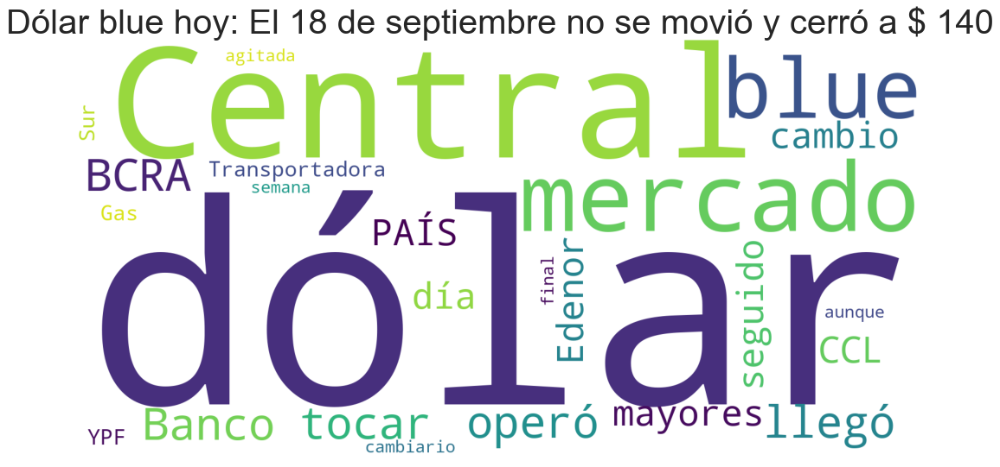

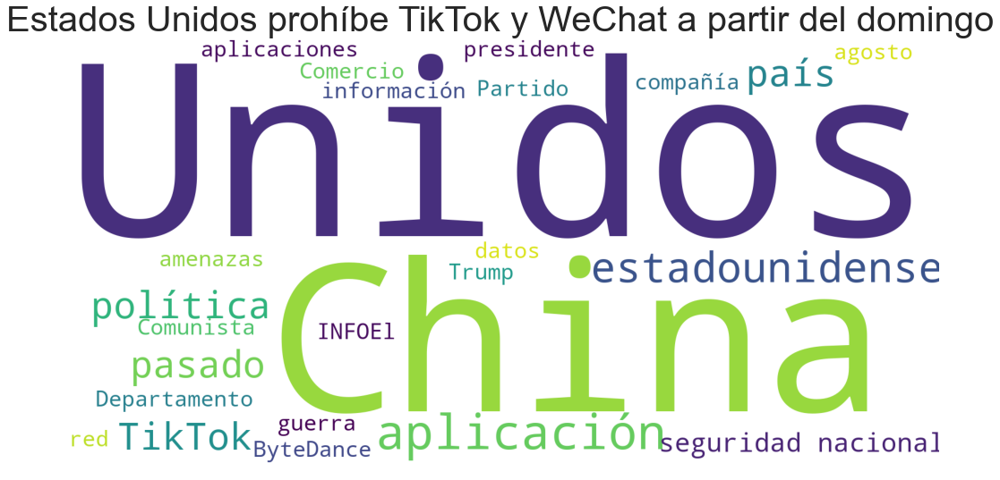

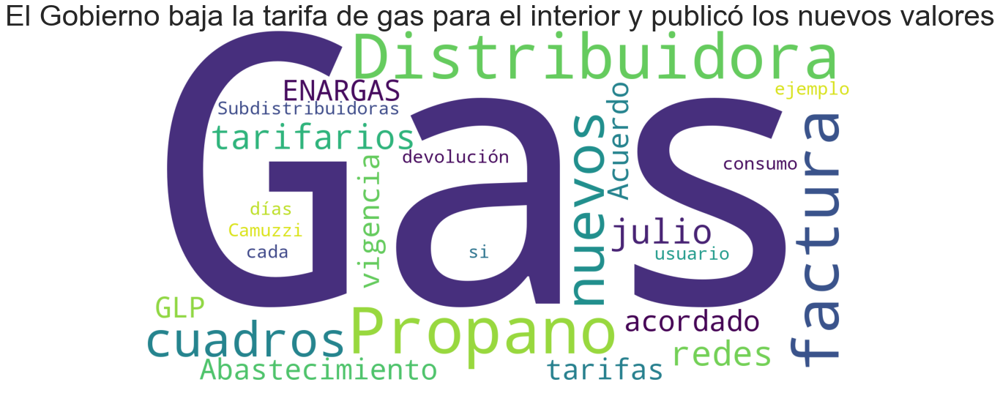

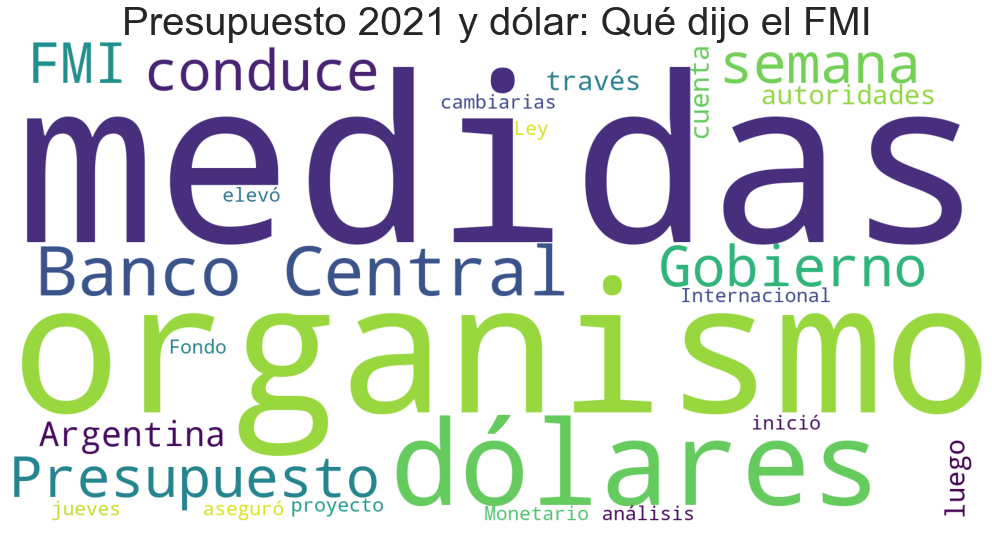

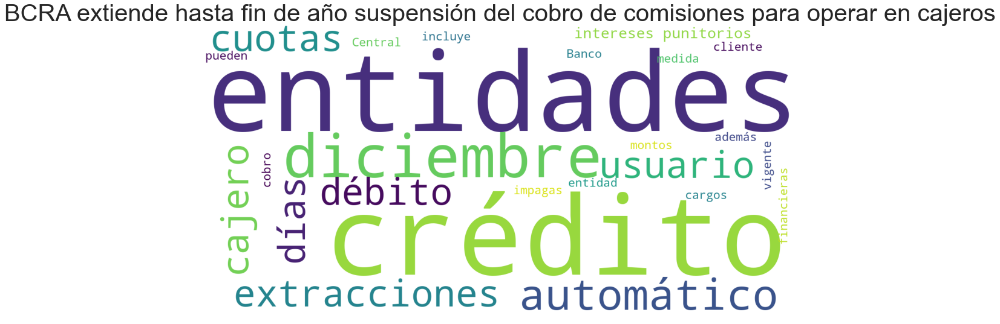

...

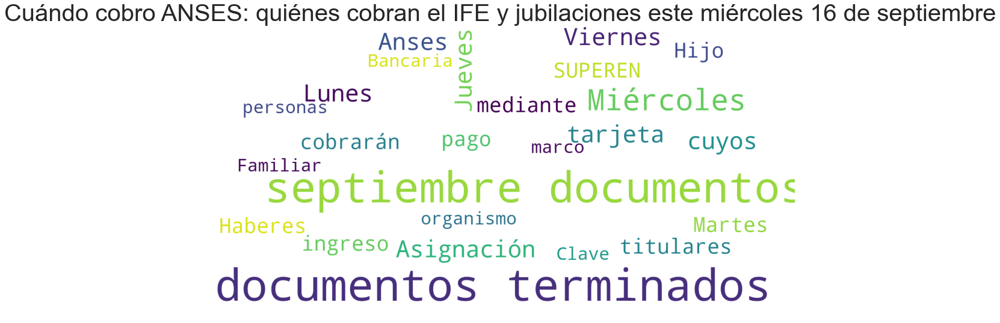

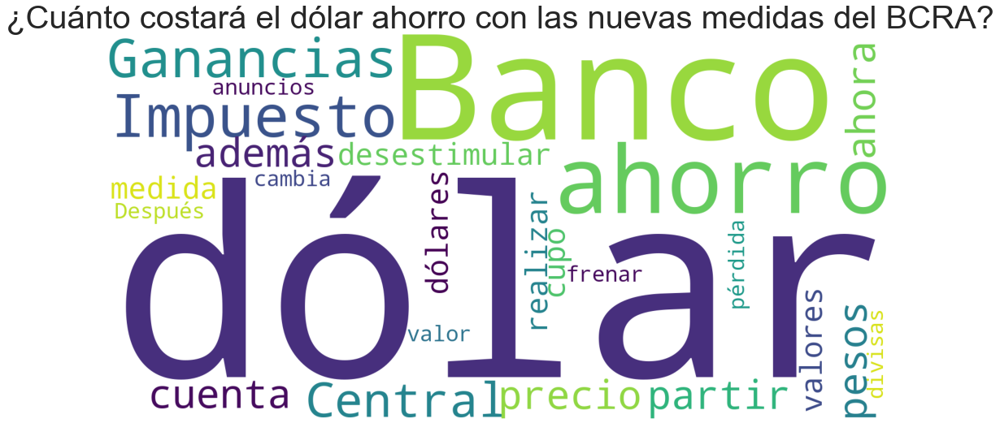

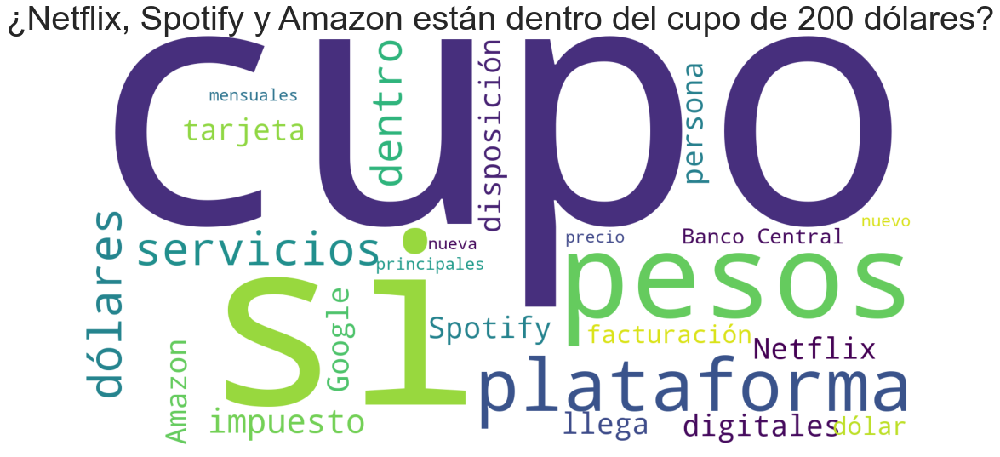

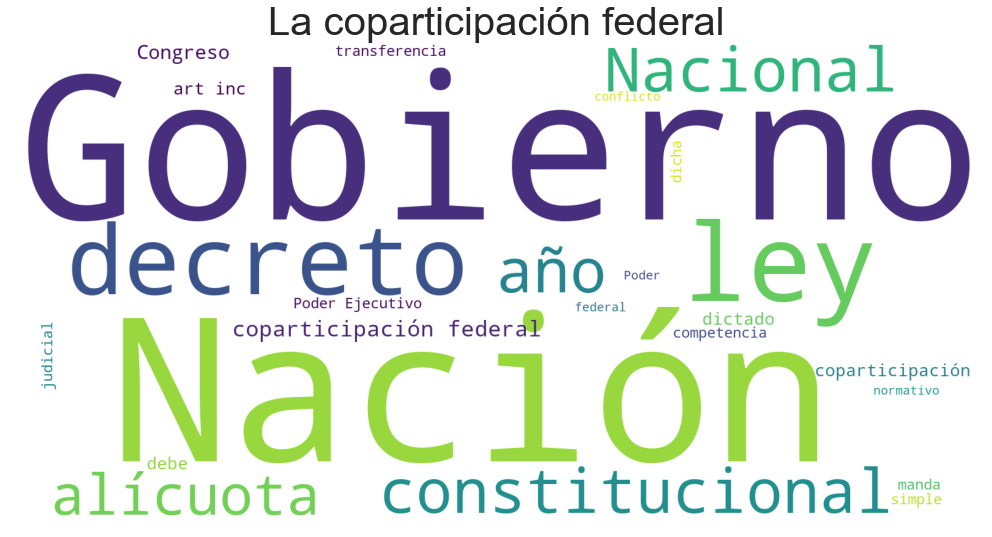

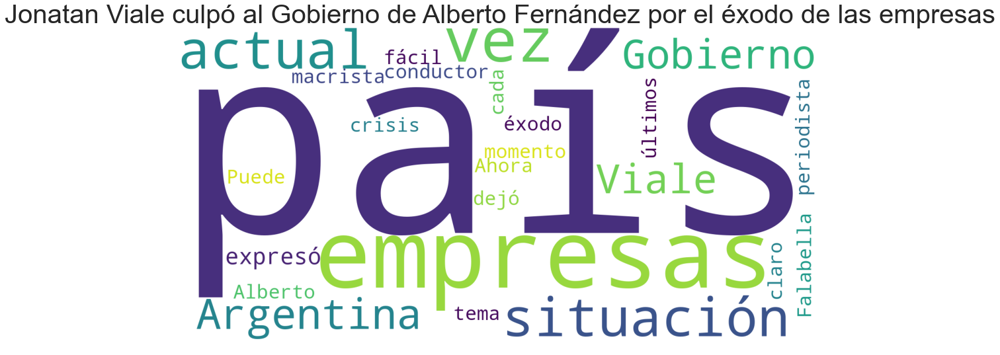

In [108]:
#bucle que grafica todas las notas de el destape
for cols in data.index:
  generateWordCloud(eldestape.loc[cols,'nota'],eldestape.loc[cols,'titulo'])

In [ ]:
#bucle que grafica todas las notas de el destape
for cols in data.index:
  generateWordCloud(lanacion.loc[cols,'nota'],lanacion.loc[cols,'titulo'])

In [ ]:
#bucle que grafica todas las notas declarin
for cols in data.index:
  generateWordCloud(clarin.loc[cols,'nota'],clarin.loc[cols,'titulo'])

In [110]:
# Une todos los articulos de cada medio
text_eldestape = ""    

for row in eldestape.iterrows():
    
    text_eldestape += eldestape["titulo"]
    text_eldestape += eldestape["nota"]
    
    
text_lanacion = ""    

for row in eldestape.iterrows():
    
    text_lanacion += lanacion["titulo"]
    text_lanacion += lanacion["nota"]
    
    
    
#text_clarin = ""    

#for row in eldestape.iterrows():
#   text_clarin += clarin["titulo"]
#   text_clarin += clarin["nota"]



# Genercacion de nubes de texto
Muestra las palabras mas frecuentes en las notas de cada medio
Shows the most frequent words in the articles of each medium

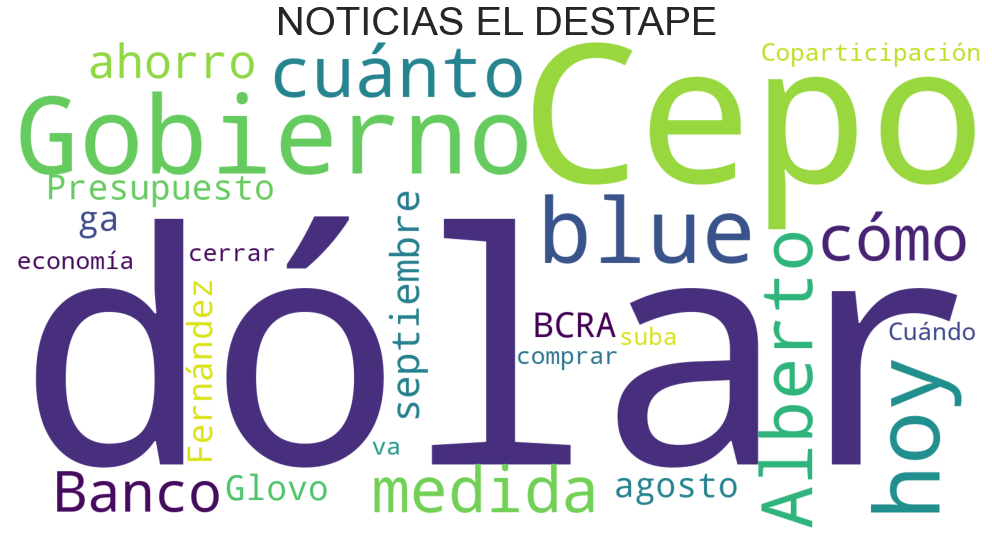

In [111]:
generateWordCloud(text_eldestape,title="NOTICIAS EL DESTAPE")

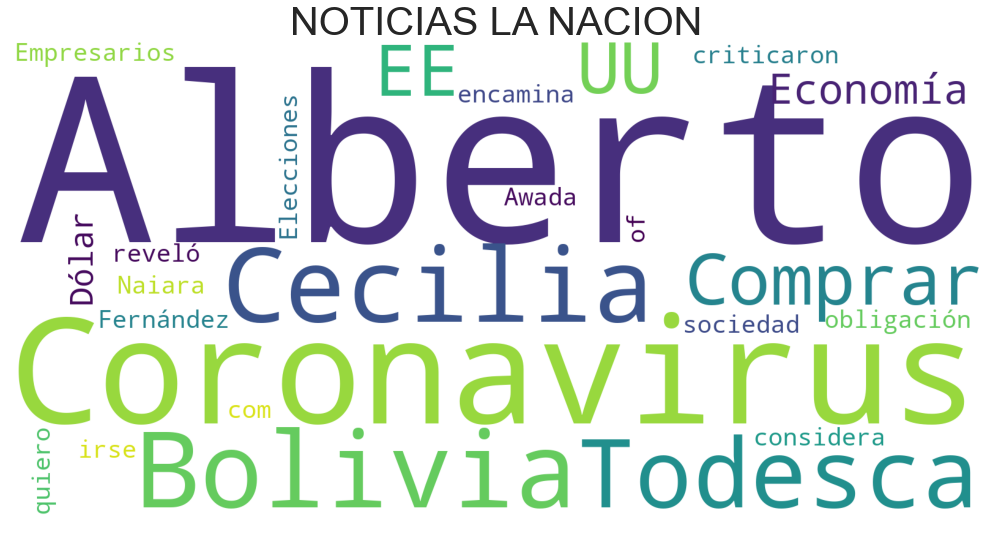

In [112]:
generateWordCloud(text_lanacion,title="NOTICIAS LA NACION")

In [ ]:
#generateWordCloud(text_clarin,title="NOTICIAS CLARIN")

# ANALISIS DE SENTIMINETO CON TEXT BLOB

### POLARIDAD 
* Mas cercano a 0 es NEGATIVO
* Mas cercano a 1 es POSITIVO


### SUBJETIVIDAD
* Mas cercano a 0 es OBJETIVO
* Mas cercano a 1 es SUBJETIVO


In [115]:
!pip install textblob

ERROR: Error checking for conflicts.
Traceback (most recent call last):
  File "c:\users\tomas\appdata\local\continuum\anaconda3\lib\site-packages\pip\_vendor\pkg_resources\__init__.py", line 3021, in _dep_map
    return self.__dep_map
  File "c:\users\tomas\appdata\local\continuum\anaconda3\lib\site-packages\pip\_vendor\pkg_resources\__init__.py", line 2815, in __getattr__
    raise AttributeError(attr)
AttributeError: _DistInfoDistribution__dep_map

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "c:\users\tomas\appdata\local\continuum\anaconda3\lib\site-packages\pip\_vendor\pkg_resources\__init__.py", line 3012, in _parsed_pkg_info
    return self._pkg_info
  File "c:\users\tomas\appdata\local\continuum\anaconda3\lib\site-packages\pip\_vendor\pkg_resources\__init__.py", line 2815, in __getattr__
    raise AttributeError(attr)
AttributeError: _pkg_info

During handling of the above exception, another exception occurred:



In [117]:
from textblob import TextBlob


In [126]:
# Evauo la polaridad con TexBlob


eldestape["polaridad"]=  eldestape["nota"].apply(lambda x: TextBlob(x).sentiment.polarity)

In [127]:
eldestape["polaridad"].head()

0    0.000000
1    0.011111
2    0.000000
3   -0.133333
4    0.000000
Name: polaridad, dtype: float64

In [122]:
eldestape["subdjetividad"]=  data["nota"].apply(lambda x: TextBlob(x).sentiment.subjectivity)

In [124]:
print("Maximo valor", data["polaridad"].mean())

Maximo valor 0.02727556317139651


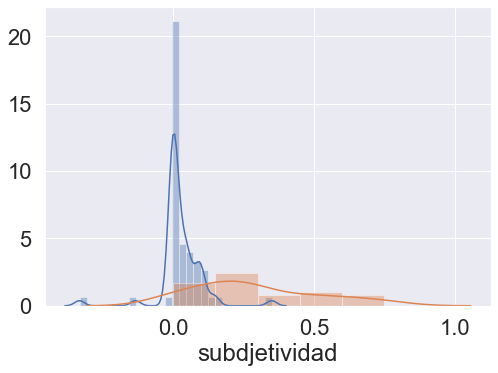

In [125]:

sns.distplot(eldestape["polaridad"])
sns.distplot(eldestape["subdjetividad"])

In [129]:
lanacion["polaridad"]=  lanacion["nota"].apply(lambda x: TextBlob(x).sentiment.polarity)

In [137]:
eldestape["polaridad"][:30]

0     0.000000
1     0.011111
2     0.000000
3    -0.133333
4     0.000000
5     0.000000
6     0.000000
7     0.027778
8     0.091667
9     0.000000
10    0.100000
11    0.000000
12    0.050000
13    0.141667
14    0.150000
15    0.075000
16    0.101190
17    0.000000
18    0.000000
19    0.016667
20    0.050000
21   -0.331818
22    0.000000
23    0.101852
24    0.000000
25    0.037500
26    0.016667
27   -0.003571
28    0.000000
29    0.000000
Name: polaridad, dtype: float64

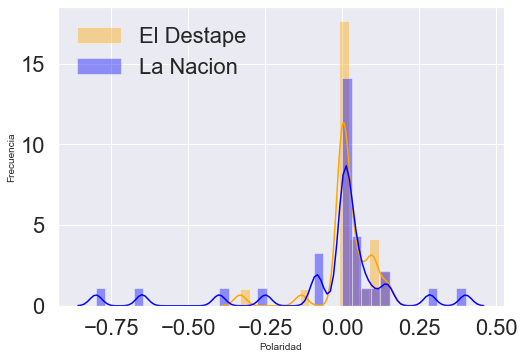

In [168]:
#comparo la distribucion de las polaridades de los ultios 30 articulos
CantidadArticulos = 30


ax = sns.distplot(eldestape["polaridad"][:CantidadArticulos],color="orange",label="El Destape")
ax = sns.distplot(lanacion["polaridad"][:CantidadArticulos],color="blue",label='La Nacion')
ax.set_xlabel('Polaridad',fontsize=10)
ax.set_ylabel('Frecuencia',fontsize=10)

plt.legend()
plt.show()

# Conclusion
Se puede ver como los articulos de "EL destape" son mas homogeneos que los d "La Nacion", estos se concentran en valores mas neutrales(ni positivos, ni negativos) minetras que en La nacion los datos se distribuyen de forma mas heterogenia, hay bastantes mas articulos negativos pero tambien hay algunos articulos positivos

# Spacy (INCOMPLETO)

In [33]:
#import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
#import os
#print(os.listdir("../input"))
import spacy
import random 
from collections import Counter #for counting
import seaborn as sns #for visualization
import matplotlib.pyplot as plt

plt.style.use('seaborn')
sns.set(font_scale=2)

C:\Users\Tomas\AppData\Local\Continuum\anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [54]:
!python -m spacy download en_core_web_sm


  Created wheel for en-core-web-sm: filename=en_core_web_sm-2.3.1-py3-none-any.whl size=12047113 sha256=1f8f41b2d0aa6a2aa0e350e4ee5e056547fb06e5448c05008cc1ddda61008011
  Stored in directory: C:\Users\Tomas\AppData\Local\Temp\pip-ephem-wheel-cache-61mqp6gy\wheels\b7\0d\f0\7ecae8427c515065d75410989e15e5785dd3975fe06e795cd9
Successfully built en-core-web-sm
[+] Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')


ERROR: Error checking for conflicts.
Traceback (most recent call last):
  File "C:\Users\Tomas\AppData\Local\Continuum\anaconda3\lib\site-packages\pip\_vendor\pkg_resources\__init__.py", line 3021, in _dep_map
    return self.__dep_map
  File "C:\Users\Tomas\AppData\Local\Continuum\anaconda3\lib\site-packages\pip\_vendor\pkg_resources\__init__.py", line 2815, in __getattr__
    raise AttributeError(attr)
AttributeError: _DistInfoDistribution__dep_map

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Users\Tomas\AppData\Local\Continuum\anaconda3\lib\site-packages\pip\_vendor\pkg_resources\__init__.py", line 3012, in _parsed_pkg_info
    return self._pkg_info
  File "C:\Users\Tomas\AppData\Local\Continuum\anaconda3\lib\site-packages\pip\_vendor\pkg_resources\__init__.py", line 2815, in __getattr__
    raise AttributeError(attr)
AttributeError: _pkg_info

During handling of the above exception, another exception occurred:



In [59]:
import en_core_web_sm
nlp = en_core_web_sm.load()

In [68]:

doc = nlp(data['nota'][0]) 

#[0][:500]

df_token = pd.DataFrame()

for i, token in enumerate(doc):
    df_token.loc[i, 'text'] = token.text
    df_token.loc[i, 'lemma'] = token.lemma_,
    df_token.loc[i, 'pos'] = token.pos_
    df_token.loc[i, 'tag'] = token.tag_
    df_token.loc[i, 'dep'] = token.dep_
    df_token.loc[i, 'shape'] = token.shape_
    df_token.loc[i, 'is_alpha'] = token.is_alpha
    df_token.loc[i, 'is_stop'] = token.is_stop

In [70]:
df_token


,text,lemma,pos,tag,dep,shape,is_alpha,is_stop
0,Sobre,Sobre,PROPN,NNP,compound,Xxxxx,True,False
1,el,"(el,)",PROPN,NNP,nmod,xx,True,False
2,final,"(final,)",PROPN,NNP,amod,xxxx,True,False
3,de,"(de,)",PROPN,NNP,nmod,xx,True,False
4,una,"(una,)",PROPN,NNP,nmod,xxx,True,False
...,...,...,...,...,...,...,...,...
413,DESTAPE,"(DESTAPE,)",PROPN,NNP,ROOT,XXXX,True,False
414,RADIO,"(radio,)",NOUN,NN,compound,XXXX,True,False
415,EN,"(en,)",NOUN,NN,compound,XX,True,False
416,VIVO,"(VIVO,)",NOUN,NNS,appos,XXXX,True,False


In [71]:
from spacy import displacy
sentence_spans = list(doc.sents)
displacy.render(sentence_spans, style='dep', jupyter=True)

In [72]:
import string
stopwords = set(stopwords.words('spanish'))
punctuations = string.punctuation

AttributeError: 'set' object has no attribute 'words'

In [74]:
# Define function to cleanup text by removing personal pronouns, stopwords, and puncuation
def cleanup_text(docs):
    texts = []
    counter = 1
    for doc in docs:
        if counter % 100 == 0:
            print('Processed {} out of {}'.format(counter, len(docs)))
        counter += 1
        doc = nlp(doc, disable=['parser', 'ner'])
        tokens = [tok.lemma_.lower().strip() for tok in doc if tok.lemma_ != '-PRON-']
        tokens = [tok for tok in tokens if tok not in stopwords and tok not in punctuations]
        tokens = ' '.join(tokens)
        texts.append(tokens)
    return pd.Series(texts)

markdown
1. find all PERSON names
2. replace these by a filler like ["REDACTED"]

In [75]:
def redact_names(text):
    
    redacted_sentence = []
    for ent in doc.ents:
        ent.merge()
    for token in doc:
        if token.ent_type_ == "PERSON":
            redacted_sentence.append("[REDACTED]")
        else:
            redacted_sentence.append(token.string)
    return "".join(redacted_sentence)

In [87]:
printmd("**Before**", color="blue")
one_sentence = data['nota'][0]
doc = nlp(one_sentence)
spacy.displacy.render(doc, style='ent',jupyter=True)
printmd("**After**", color="blue")
one_sentence = redact_names(data['nota'][0])
doc = nlp(one_sentence)
spacy.displacy.render(doc, style='ent',jupyter=True)



<span style='color:blue'>**Before**</span>

<span style='color:blue'>**After**</span>

C:\Users\Tomas\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:5: DeprecationWarning: [W013] As of v2.1.0, Span.merge is deprecated. Please use the more efficient and less error-prone Doc.retokenize context manager instead.
  """
C:\Users\Tomas\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:5: DeprecationWarning: [W013] As of v2.1.0, Doc.merge is deprecated. Please use the more efficient and less error-prone Doc.retokenize context manager instead.
  """


In [80]:
import json
def pretty_print(pp_object):
    print(json.dumps(pp_object, indent=2))
    
from IPython.display import Markdown, display
def printmd(string, color=None):
    colorstr = "<span style='color:{}'>{}</span>".format(color, string)
    display(Markdown(colorstr))

In [88]:
example_text = data['nota'][20]
doc = nlp(example_text)
spacy.displacy.render(doc, style='ent', jupyter=True)

for idx, sentence in enumerate(doc.sents):
    for noun in sentence.noun_chunks:
        print(f"sentence {idx+1} has noun chunk '{noun}'")

sentence 1 has noun chunk 'Si bien los tractores'
sentence 1 has noun chunk 'los herbicidas se mantienen al tope de la demanda'
sentence 1 has noun chunk 'el mercado nacional'
sentence 1 has noun chunk ', poco'
sentence 1 has noun chunk 'a poco surgen nuevas opciones'
sentence 1 has noun chunk 'vanguardistas para que'
sentence 1 has noun chunk 'los productores'
sentence 3 has noun chunk 'Guerra Judicial'
sentence 4 has noun chunk 'en'
sentence 5 has noun chunk 'ArgentinaLos avances'
sentence 6 has noun chunk 'de la producción'
sentence 7 has noun chunk 'intensifican y son'
sentence 7 has noun chunk 'el camino'
sentence 7 has noun chunk 'ideal para mejorar los resultados'
sentence 7 has noun chunk 'calidad como'
sentence 8 has noun chunk 'Asimismo, los insumos se transforman'
sentence 9 has noun chunk 'un retorno veloz de la inversión por parte de los productores que aumentaron su'
sentence 9 has noun chunk 'mercados diversos como terrenos'
sentence 9 has noun chunk 'silo bolsas y venta

In [91]:
one_sentence = data['nota'][50]
doc = nlp(one_sentence)
spacy.displacy.render(doc, style='ent', jupyter=True)

for token in doc:
    print(token, token.pos_)

El PROPN
anuncio PROPN
de PROPN
nuevos PROPN
impuestos PROPN
para PROPN
la PROPN
compra PROPN
de PROPN
divisas PROPN
extranjeras PROPN
  SPACE
y PROPN
modificaciones PROPN
sobre PROPN
el PROPN
cepo PROPN
al PROPN
dólar PROPN
generan PROPN
diversas PROPN
dudas NOUN
. PUNCT
Una PROPN
de PROPN
ellas PROPN
es X
qué PROPN
pasa PROPN
en ADP
el PROPN
caso PROPN
de PROPN
pagos PROPN
realizados PROPN
en ADP
el PROPN
exterior PROPN
durante PROPN
un PROPN
viaje PROPN
¿ PROPN
Se PROPN
restan PROPN
del PROPN
tope NOUN
de ADP
200 NUM
dólares NOUN
para PROPN
atesoramiento PROPN
? PUNCT
¿ PROPN
No PROPN
se PROPN
puede X
gastar PROPN
más PROPN
de PROPN
ese PROPN
monto PROPN
? PUNCT
Las PROPN
respuestas VERB
acá PROPN
. PUNCT
Guerra PROPN
Judicial PROPN
en PROPN
ArgentinaLas PROPN
nuevas PROPN
medidas PROPN
comunicadas PROPN
por PROPN
el PROPN
Banco PROPN
Central PROPN
incluyen PROPN
el PROPN
pago PROPN
de PROPN
un PROPN
anticipo PROPN
del PROPN
35 NUM
% NOUN
de X
impuesto PROPN
a DET
las PROPN
Ganancia